# Лабораторная работа № 4 - Ансамбли

Задачи:
- Провести EDA, предобработать скалировать очитстить от пропусков и выбросов
- Обучить дерево решений, вручную подобрать глубину дерева, автоматически подобрать параметры при помощи `GridSearchCV`
- Выбрать классические не ансамблевые модели, на их основе обучить ансамбли `Bagging, Stacking`, подобрать параметры при помощи `GridSearchCV`
- Обучить RandomForest и XGboost, подобрать параметры через `GridSearchCV`
- Провести F-test и посмотреть на важность признаков

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt

In [ ]:
!gdown 1jRplpgxEMPQpB6n2q853ruT9wr696Qjz

Downloading...
From: https://drive.google.com/uc?id=1jRplpgxEMPQpB6n2q853ruT9wr696Qjz
To: /content/credit_scoring.csv
100% 3.95M/3.95M [00:00<00:00, 221MB/s]


In [ ]:
path = "/content/credit_scoring.csv"

In [ ]:
data = pd.read_csv(path, index_col="client_id")
data.head(3)

,DIR,Age,NumLoans,NumRealEstateLoans,NumDependents,Num30-59Delinquencies,Num60-89Delinquencies,Income,BalanceToCreditLimit,Delinquent90
client_id,,,,,,,,,,
0,0.496289,49.1,13,0,0.0,2,0,5298.360639,0.387028,0
1,0.433567,48.0,9,2,2.0,1,0,6008.056256,0.234679,0
2,2206.731199,55.5,21,1,NaN,1,0,NaN,0.348227,0


# 1 Предобработка

In [ ]:
display(data.info())
print("\n \n---------------------\n")
display(data.describe().T)
print("\n----------------")
display(data.sample(3))

<class 'pandas.core.frame.DataFrame'>
Index: 75000 entries, 0 to 74999
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   DIR                    75000 non-null  float64
 1   Age                    75000 non-null  float64
 2   NumLoans               75000 non-null  int64  
 3   NumRealEstateLoans     75000 non-null  int64  
 4   NumDependents          73084 non-null  float64
 5   Num30-59Delinquencies  75000 non-null  int64  
 6   Num60-89Delinquencies  75000 non-null  int64  
 7   Income                 60153 non-null  float64
 8   BalanceToCreditLimit   75000 non-null  float64
 9   Delinquent90           75000 non-null  int64  
dtypes: float64(5), int64(5)
memory usage: 6.3 MB


None


 
---------------------



,count,mean,std,min,25%,50%,75%,max
DIR,75000.0,353.260293,2117.237432,0.0,0.176022,0.366848,0.862650,3.326003e+05
Age,75000.0,52.595605,14.869729,21.0,41.300000,52.200000,63.100000,1.098000e+02
NumLoans,75000.0,8.449760,5.156440,0.0,5.000000,8.000000,11.000000,5.600000e+01
NumRealEstateLoans,75000.0,1.016693,1.124019,0.0,0.000000,1.000000,2.000000,3.200000e+01
NumDependents,73084.0,0.755966,1.108119,0.0,0.000000,0.000000,1.000000,2.000000e+01
Num30-59Delinquencies,75000.0,0.428320,4.276439,0.0,0.000000,0.000000,0.000000,9.800000e+01
Num60-89Delinquencies,75000.0,0.248000,4.239486,0.0,0.000000,0.000000,0.000000,9.800000e+01
Income,60153.0,6740.059287,14228.754880,0.0,3421.353782,5424.552473,8291.517816,1.805573e+06
BalanceToCreditLimit,75000.0,6.276196,267.743321,0.0,0.029703,0.153720,0.560638,5.087387e+04
Delinquent90,75000.0,0.066840,0.249746,0.0,0.000000,0.000000,0.000000,1.000000e+00



----------------


,DIR,Age,NumLoans,NumRealEstateLoans,NumDependents,Num30-59Delinquencies,Num60-89Delinquencies,Income,BalanceToCreditLimit,Delinquent90
client_id,,,,,,,,,,
53406,0.012230,55.2,0,0,1.0,2,0,2657.078848,1.001006,1
74164,2637.338550,57.3,4,1,0.0,0,0,NaN,0.076202,0
44157,0.101597,33.2,1,0,1.0,0,1,6559.803948,1.008797,0


Записей намного больше чем в предыдущих лабах 75к. Пропуски только в 2-х признаках: `NumDependents, Income`, отрицательных значений нет и на этом спасибо)

1. `DIR` - есть явные выбросы, 75 -перцентиль 0.8, при этом максимальное значение 3.3 * 10^5, будем разбираться
2. Вещественный `Age` выглядит не очень, а также долгожители немного смущают
3. `Income, BalanceToCreditLimit` - выбросы аналогично DIR
4. `Num30-59Delinquencies, Num60-89Delinquencies` - в просрочках 75 процентов записей имеют значение 0, это по идее хорошо - все платят исправно, посмотрим что с этим можно сделать
5. `Delinquent90` - несбалансированный бинарный признак, явное смещение в сторону 0

## Обработка пропусков

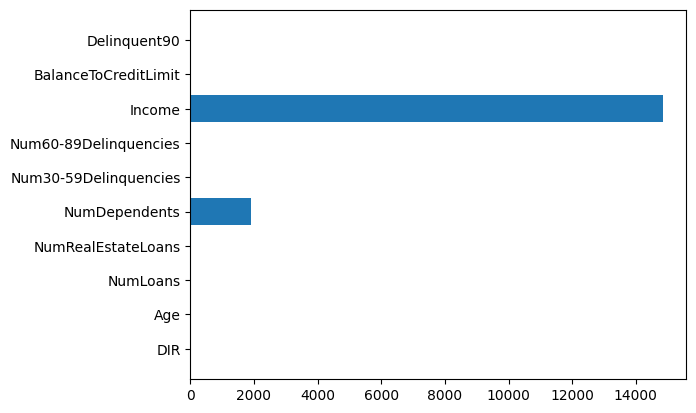

In [ ]:
null_values = data.isna().sum().reset_index()
null_values.columns = ["feature", "NullCount"]
plt.barh(y=null_values.feature, width=null_values.NullCount)
plt.show()

In [ ]:
null_values["percent"] = (null_values.NullCount / len(data)) * 100
null_values

,feature,NullCount,percent
0,DIR,0,0.000000
1,Age,0,0.000000
2,NumLoans,0,0.000000
3,NumRealEstateLoans,0,0.000000
4,NumDependents,1916,2.554667
5,Num30-59Delinquencies,0,0.000000
6,Num60-89Delinquencies,0,0.000000
7,Income,14847,19.796000
8,BalanceToCreditLimit,0,0.000000
9,Delinquent90,0,0.000000


In [ ]:
data.Income.isna().sum()

np.int64(14847)

`NumDependents` - признак дискретный пропусков всего 2.5 процента - удаляем

`Income` - была идея посмотреть на корреляции, и заполнить в зависимости от другого признака, но корреляция особо нет, заполнять средним мне не очень нравиться будут пики, заполним случайным в диапозоне от 1 до 3 квартиля

In [ ]:
fig = px.histogram(
    data.Income
)
fig.show()

In [ ]:
values = np.random.uniform(data.Income.quantile(.25), data.Income.quantile(.75), size=data.Income.isna().sum())
len(values)

14847

In [ ]:
data.loc[data.Income.isna(), "Income"] = values
print(data.shape)
data = data.dropna(subset=["NumDependents"])
print(data.shape)
display(data.isna().sum())

(75000, 10)
(73084, 10)


,0
DIR,0
Age,0
NumLoans,0
NumRealEstateLoans,0
NumDependents,0
Num30-59Delinquencies,0
Num60-89Delinquencies,0
Income,0
BalanceToCreditLimit,0
Delinquent90,0


## Обработка аномалий и выбросов

Поробую теперь не только удалять выбросы через IQR, а еще и логарифмировать

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [ ]:
# @title
def IQR_clean(x: pd.DataFrame, r=False):
  Q1 = x.quantile(0.25)
  Q3 = x.quantile(0.75)
  IQR = Q3 - Q1
  thrs = Q3 + 1.5 * IQR
  print(f'Выбросы в признаке {x.name}: {x[x > thrs].shape}, {(100 * x[x > thrs].shape[0] / x.shape[0]):.1f} %')
  print(f'Остаток: {x[x <= thrs].shape}')
  if r:
    return x > thrs

In [ ]:
# @title
def draw_distr(x, title):
  fig = make_subplots(rows=1, cols=4, column_titles=["BoxPlot", "Histogramm", "LogHist", "IQR_clear"])
  fig.add_trace(
      go.Box(
          y=x,
          name=title,
          boxpoints="outliers"
      ),
      row=1, col=1
  )

  fig.add_trace(
      go.Histogram(
          x=x,
          name=title,
        ),
      row=1, col=2
  )
  fig.add_trace(
      go.Histogram(
          x=np.log(x + 1),
          name=title,
        ),
      row=1, col=3
  )
  fig.add_trace(
      go.Histogram(
          x=x[np.logical_not(IQR_clean(x, True))],
          name=title,
        ),
      row=1, col=4
  )
  fig.update_layout(height=400, width=1000, showlegend=True, title_text=title, title_font_size=26, title_x=0.5,)
  fig.show()

`DIR`

In [ ]:
draw_distr(data.DIR, "DIR")

Выбросы в признаке DIR: (14102,), 19.3 %
Остаток: (58982,)


In [ ]:
data.DIR = np.log(data.DIR + 1)

`Age` - поменяем на int, уберем выбросы

In [ ]:
data.Age = np.int64(data.Age)
draw_distr(data.Age, "Age")

Выбросы в признаке Age: (61,), 0.1 %
Остаток: (73023,)


In [ ]:
data = data.drop(index=data[IQR_clean(data.Age, True)].index)
data.shape

Выбросы в признаке Age: (61,), 0.1 %
Остаток: (73023,)


(73023, 10)

`NumLoans, NumRealEstateLoans, NumDependents` - дискретные признаки, прологарифмировать не получиться, воспользуемся IQR

In [ ]:
f = "NumLoans, NumRealEstateLoans, NumDependents".split(", ")
for i in f:
  draw_distr(data[i], i)

Выбросы в признаке NumLoans: (1986,), 2.7 %
Остаток: (71037,)


Выбросы в признаке NumRealEstateLoans: (422,), 0.6 %
Остаток: (72601,)


Выбросы в признаке NumDependents: (6518,), 8.9 %
Остаток: (66505,)


В каждом признаке удалим нерепрезентативные значения

In [ ]:
for i in f:
  data = data.drop(index=data[IQR_clean(data[i], True)].index)
  print("Удалено")

Выбросы в признаке NumLoans: (1986,), 2.7 %
Остаток: (71037,)
Удалено
Выбросы в признаке NumRealEstateLoans: (302,), 0.4 %
Остаток: (70735,)
Удалено
Выбросы в признаке NumDependents: (6325,), 8.9 %
Остаток: (64410,)
Удалено


`Income, BalanceToCreditLimit`

In [ ]:
f = "Income, BalanceToCreditLimit".split(", ")
for i in f:
  draw_distr(data[i], i)

Выбросы в признаке Income: (2892,), 4.5 %
Остаток: (61518,)


Выбросы в признаке BalanceToCreditLimit: (335,), 0.5 %
Остаток: (64075,)


In [ ]:
for i in f:
  data = data.drop(index=data[IQR_clean(data[i], True)].index)
  print("Удалено")

Выбросы в признаке Income: (2892,), 4.5 %
Остаток: (61518,)
Удалено
Выбросы в признаке BalanceToCreditLimit: (315,), 0.5 %
Остаток: (61203,)
Удалено


`Num30-59Delinquencies, Num60-89Delinquencies` Мне эти признаки не очень нравятся, во-первых они повторяют друг друга. Во-вторых не совсем понимаю, что они в себе несут. Замених их на бинарный признак есть ли просрока менее 90 дней. По идее если у человека есть просрочка менее 90 дней, то это может означать, что у него будет просрочка больше 90 дней. Ведь у всех кого просрочка больше 90 дней, когда то была просрочка меньше 90



In [ ]:
f = "Num30-59Delinquencies, Num60-89Delinquencies".split(", ")
for i in f:
  display(data[i].value_counts().reset_index().T)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
Num30-59Delinquencies,0,1,2,3,4,5,98,6,7,8,10,12,11,9,96
count,51830,6312,1775,673,277,133,118,51,21,5,3,2,1,1,1


,0,1,2,3,4,5,6,7,8,9,10
Num60-89Delinquencies,0,1,2,3,98,4,5,6,7,96,11
count,58173,2303,432,120,118,39,10,5,1,1,1


In [ ]:
data["IsDelinquenciesUnder90"] = np.where((data["Num60-89Delinquencies"] > 0) | (data["Num30-59Delinquencies"] > 0), 1, 0)
data = data.drop(columns=["Num60-89Delinquencies", "Num30-59Delinquencies"])

In [ ]:
data

,DIR,Age,NumLoans,NumRealEstateLoans,NumDependents,Income,BalanceToCreditLimit,Delinquent90,IsDelinquenciesUnder90
client_id,,,,,,,,,
0,0.402988,49,13,0,0.0,5298.360639,0.387028,0,1
1,0.360166,48,9,2,2.0,6008.056256,0.234679,0,1
3,6.787995,55,3,0,0.0,5803.727757,0.971930,0,0
4,0.000000,52,1,0,0.0,2504.613105,1.004350,0,0
6,0.379253,71,9,0,0.0,3562.767475,0.039618,0,0
...,...,...,...,...,...,...,...,...,...
74993,0.258163,30,4,0,0.0,2004.540110,0.715404,0,0
74994,0.147243,46,7,1,1.0,12220.413834,0.370935,0,0
74996,7.643321,43,1,1,0.0,7680.323767,1.005390,0,0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 61203 entries, 0 to 74999
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   DIR                     61203 non-null  float64
 1   Age                     61203 non-null  int64  
 2   NumLoans                61203 non-null  int64  
 3   NumRealEstateLoans      61203 non-null  int64  
 4   NumDependents           61203 non-null  float64
 5   Income                  61203 non-null  float64
 6   BalanceToCreditLimit    61203 non-null  float64
 7   Delinquent90            61203 non-null  int64  
 8   IsDelinquenciesUnder90  61203 non-null  int64  
dtypes: float64(4), int64(5)
memory usage: 4.7 MB


In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
DIR,61203.0,1.530452,2.635690,0.0,0.155927,0.312480,0.625843,12.714700
Age,61203.0,52.467265,15.175447,21.0,41.000000,52.000000,63.000000,93.000000
NumLoans,61203.0,7.917814,4.360257,0.0,5.000000,7.000000,11.000000,20.000000
NumRealEstateLoans,61203.0,0.914318,0.934426,0.0,0.000000,1.000000,1.000000,5.000000
NumDependents,61203.0,0.481823,0.732792,0.0,0.000000,0.000000,1.000000,2.000000
Income,61203.0,5511.525898,2752.503049,0.0,3549.262287,5204.400490,7225.948714,13466.316594
BalanceToCreditLimit,61203.0,0.318688,0.354768,0.0,0.028241,0.147447,0.556546,1.374918
Delinquent90,61203.0,0.064327,0.245336,0.0,0.000000,0.000000,0.000000,1.000000
IsDelinquenciesUnder90,61203.0,0.174191,0.379277,0.0,0.000000,0.000000,0.000000,1.000000


## Несбалансированность `Delinquent90`

Пока, что просто обозначу эту проблему, в дальнейшем буду подбирать порог классификации и устанавливать взвешивание классов в моделях

In [ ]:
data.Delinquent90.value_counts()

,count
Delinquent90,
0,57266
1,3937


In [ ]:
fig = px.histogram(data.Delinquent90)
fig.show()

In [ ]:
fig = px.imshow(data.corr().round(3), text_auto=True)
fig.show()

In [ ]:
data = data.reset_index().drop("client_id", axis=1)

## Подготовка к обучению

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [ ]:
scaler = StandardScaler()

X_scaled = scaler.fit_transform(data.drop(["Delinquent90"], axis=1))
X_train, X_test, y_train, y_test = train_test_split(X_scaled, data.Delinquent90, test_size=0.2, random_state=42)

# 2 Дерево решений

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, f1_score, roc_auc_score
from sklearn.model_selection import GridSearchCV

In [ ]:
d_tree = DecisionTreeClassifier(criterion="entropy", random_state=42, min_samples_leaf=20, max_depth=5, class_weight="balanced")
d_tree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, min_samples_leaf=20, random_state=42)

In [ ]:
def f1_th(y_true, y_proba, show=True):
  th = np.arange(0.1, 1, 0.1)
  scores = []
  m = (0, 0) # score / thrs
  for t in th:
    scores.append(f1_score(y_true, (y_proba > t).astype(np.int64)))
    m = max(m, (scores[-1], t))
  if show:
    fig = px.line(
        x=th,
        y=scores,
        markers=True
    )
    fig.update_layout(
      title=f'F1 от порога определения класса',
      xaxis_title='Threshold',
      yaxis_title='F1-Score',
    )
    fig.show()
  return (y_proba > m[1]).astype(np.int64)

In [ ]:
d_tree_pred = f1_th(y_test, d_tree.predict_proba(X_test)[:, 1])

In [ ]:
print(classification_report(y_test, d_tree_pred))
print(roc_auc_score(y_test, d_tree_pred))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95     11415
           1       0.34      0.41      0.37       826

    accuracy                           0.91     12241
   macro avg       0.65      0.68      0.66     12241
weighted avg       0.92      0.91      0.91     12241

0.6770332142300338


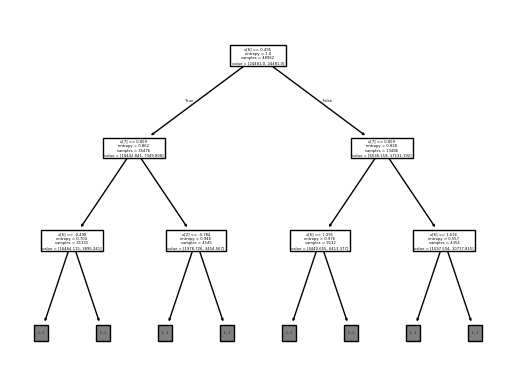

In [ ]:
plot_tree(d_tree, max_depth=2)
plt.show()

## Подбор оптимальной глубины дерева

In [ ]:
test_scores = []
train_scores = []
for i in range(2, 15):
  tree = DecisionTreeClassifier(criterion="entropy", random_state=42, min_samples_leaf=20, max_depth=i, class_weight="balanced")
  tree.fit(X_train, y_train)
  test_pred = f1_th(y_test, tree.predict_proba(X_test)[:, -1], False)
  train_pred = f1_th(y_train, tree.predict_proba(X_train)[:, -1], False)
  test_scores.append(f1_score(y_test, test_pred))
  train_scores.append(f1_score(y_train, train_pred))

In [ ]:
score = pd.DataFrame(
    {
        "depth": list(range(2, 15)),
        "train": train_scores,
        "test": test_scores,
    }
)

In [ ]:
fig = px.line(data_frame=score, x="depth", y =["train", "test"], markers=True)
fig.show()

По моему мнению оптимальная глубина дерева - 6. Потому как значения f1 score на тестовой и тренировной выборке наиболее близки и максимальны. Начиная с 7 глубины и дальше модель начинает переобучаться, это видно по росту f1 на тренировной выборке и снижению на тестовой

## Подбор опитимальных параметров с помощью `GridSearchCV`

In [ ]:
d_tree = DecisionTreeClassifier(criterion="entropy", random_state=42, min_samples_leaf=20, max_depth=5, class_weight="balanced")
param_grid = {
    'max_depth': [5, 7, 10, 15, 25],
    'min_samples_leaf': [5, 10, 20, 30, 50],

}
grid_search = GridSearchCV(
    estimator=d_tree,
    param_grid=param_grid,
    scoring='f1',
    n_jobs=-1,
    verbose=2,

)

In [ ]:
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


GridSearchCV(estimator=DecisionTreeClassifier(class_weight='balanced',
                                              criterion='entropy', max_depth=5,
                                              min_samples_leaf=20,
                                              random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [5, 7, 10, 15, 25],
                         'min_samples_leaf': [5, 10, 20, 30, 50]},
             scoring='f1', verbose=2)

In [ ]:
print(grid_search.best_score_)
print(grid_search.best_params_)

0.28092053700157643
{'max_depth': 5, 'min_samples_leaf': 5}


In [ ]:
grid_search_pred = f1_th(y_test, grid_search.predict_proba(X_test)[:, -1], False)
print(classification_report(y_test, grid_search_pred))
print(roc_auc_score(y_test, grid_search_pred))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95     11415
           1       0.34      0.41      0.37       826

    accuracy                           0.91     12241
   macro avg       0.65      0.68      0.66     12241
weighted avg       0.92      0.91      0.91     12241

0.6771646202747118


GridSearch показал оптимальные параметры в 5 глубины, и 5 min_samples_leaf

# 3 Ансамблевые методы

## Bagging



> В ансамблевых алгоритмах методы бэггинга образуют класс алгоритмов, которые строят несколько экземпляров оценщика типа «черный ящик» на случайных подмножествах исходного обучающего набора, а затем агрегируют их индивидуальные прогнозы для формирования окончательного прогноза. Эти методы используются для уменьшения дисперсии базового оценщика (например, дерева решений) путем введения рандомизации в процедуру его построения и последующего создания ансамбля. Во многих случаях методы бэггинга представляют собой очень простой способ улучшения по отношению к одной модели, не требуя адаптации базового алгоритма. Поскольку они обеспечивают способ уменьшения переобучения, методы бэггинга лучше всего работают со сильными и сложными моделями (например, полностью развитыми деревьями решений), в отличие от методов бустинга, которые обычно лучше всего работают со слабыми моделями (например, неглубокими деревьями решений).



Из описания sklearn следует что в bagging нужно передавать глубокие и сложные деревья

In [ ]:
from sklearn.ensemble import BaggingClassifier

In [ ]:
d_tree = DecisionTreeClassifier(criterion="entropy", random_state=42, min_samples_leaf=1, max_depth=None, class_weight="balanced")

In [ ]:
bagging = BaggingClassifier(
    estimator=d_tree,
    n_estimators=20,
    n_jobs=-1,
    random_state=42,
)

In [ ]:
bagging.fit(X_train, y_train)
bagging_pred = f1_th(y_test, bagging.predict_proba(X_test)[:, -1], False)

In [ ]:
print(classification_report(y_test, bagging_pred))
print(roc_auc_score(y_test, bagging_pred))

              precision    recall  f1-score   support

           0       0.95      0.93      0.94     11415
           1       0.29      0.38      0.33       826

    accuracy                           0.89     12241
   macro avg       0.62      0.65      0.63     12241
weighted avg       0.91      0.89      0.90     12241

0.6548716219154314


In [ ]:
bagg_grid = param_grid = {
    'n_estimators': [5, 10, 20],
    'max_samples': [0.7, 1.0],
    'max_features': [0.7, 1.0],
    'estimator__max_depth': [10, 50, 100, None],
    'estimator__min_samples_leaf': [1, 5]
}
bagg_grid_search = GridSearchCV(
    estimator=bagging,
    param_grid=bagg_grid,
    scoring='f1',
    n_jobs=-1,
    verbose=2,
    cv=2,
)
bagg_grid_search.fit(X_train, y_train)

Fitting 2 folds for each of 96 candidates, totalling 192 fits


GridSearchCV(cv=2,
             estimator=BaggingClassifier(estimator=DecisionTreeClassifier(class_weight='balanced',
                                                                          criterion='entropy',
                                                                          random_state=42),
                                         n_estimators=20, n_jobs=-1,
                                         random_state=42),
             n_jobs=-1,
             param_grid={'estimator__max_depth': [10, 50, 100, None],
                         'estimator__min_samples_leaf': [1, 5],
                         'max_features': [0.7, 1.0], 'max_samples': [0.7, 1.0],
                         'n_estimators': [5, 10, 20]},
             scoring='f1', verbose=2)

In [ ]:
bagg_grid_search_pred = f1_th(y_test, bagg_grid_search.predict_proba(X_test)[:, -1], False)
print(bagg_grid_search.best_params_)
print(classification_report(y_test, bagg_grid_search_pred))
print("Roc-auc", roc_auc_score(y_test, bagg_grid_search_pred))

{'estimator__max_depth': 10, 'estimator__min_samples_leaf': 5, 'max_features': 0.7, 'max_samples': 0.7, 'n_estimators': 20}
              precision    recall  f1-score   support

           0       0.96      0.91      0.94     11415
           1       0.29      0.52      0.37       826

    accuracy                           0.88     12241
   macro avg       0.63      0.71      0.65     12241
weighted avg       0.92      0.88      0.90     12241

Roc-auc 0.7122275498764953


## `StackingClassifier`

In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

In [ ]:
d_tree = DecisionTreeClassifier(criterion="entropy", random_state=42, min_samples_leaf=5, max_depth=5, class_weight="balanced")

In [ ]:
stck = StackingClassifier(
    estimators=[
        ("dt", d_tree),
        ("knn", KNeighborsClassifier(n_jobs=-1)),
        ("svm", LinearSVC(class_weight="balanced")),
        ("lgr", LogisticRegression(class_weight="balanced"))

    ],
    final_estimator=LogisticRegression(class_weight="balanced"),
    n_jobs=-1,
)

In [ ]:
stck.fit(X_train, y_train)
stck_pred = f1_th(y_test, stck.predict_proba(X_test)[:, -1], False)

In [ ]:
print(classification_report(y_test, stck_pred))
print(roc_auc_score(y_test, stck_pred))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95     11415
           1       0.35      0.42      0.38       826

    accuracy                           0.91     12241
   macro avg       0.65      0.68      0.67     12241
weighted avg       0.92      0.91      0.91     12241

0.6822700473761744


In [ ]:
stck_grid = {
    "knn__n_neighbors": [5, 10, 15],
    "final_estimator": [KNeighborsClassifier(n_jobs=-1), LogisticRegression(class_weight="balanced"), d_tree],
}
stck_gs = GridSearchCV(
    estimator=stck,
    param_grid=stck_grid,
    n_jobs=-1
)
stck_gs.fit(X_train, y_train)

GridSearchCV(estimator=StackingClassifier(estimators=[('dt',
                                                       DecisionTreeClassifier(class_weight='balanced',
                                                                              criterion='entropy',
                                                                              max_depth=5,
                                                                              min_samples_leaf=5,
                                                                              random_state=42)),
                                                      ('knn',
                                                       KNeighborsClassifier(n_jobs=-1)),
                                                      ('svm',
                                                       LinearSVC(class_weight='balanced')),
                                                      ('lgr',
                                                       LogisticRegression(class_weight='balanced'))],
                                          final_estimator=LogisticRegression(class_weight='balanced'),
                                          n_jobs=-1),
             n_jobs=-1,
             param_grid={'final_estimator': [KNeighborsClassifier(n_jobs=-1),
                                             LogisticRegression(class_weight='balanced'),
                                             DecisionTreeClassifier(class_weight='balanced',
                                                                    criterion='entropy',
                                                                    max_depth=5,
                                                                    min_samples_leaf=5,
                                                                    random_state=42)],
                         'knn__n_neighbors': [5, 10, 15]})

In [ ]:
stck_gs_pred = f1_th(y_test, stck_gs.predict_proba(X_test)[:, -1], False)
print(stck_gs.best_params_)
print(classification_report(y_test, stck_gs_pred))
print(roc_auc_score(y_test, stck_gs_pred))

{'final_estimator': KNeighborsClassifier(n_jobs=-1), 'knn__n_neighbors': 5}
              precision    recall  f1-score   support

           0       0.95      0.95      0.95     11415
           1       0.29      0.28      0.28       826

    accuracy                           0.90     12241
   macro avg       0.62      0.62      0.62     12241
weighted avg       0.90      0.90      0.90     12241

0.6155483895600602


## `RandomForestClassifier`

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rnd_f = RandomForestClassifier(
    n_estimators=100,
    max_depth=10,
    min_samples_leaf=10,
    n_jobs=-1,
)

rnd_f.fit(X_train, y_train)
rnd_pred = f1_th(y_test, rnd_f.predict_proba(X_test)[:, -1], False)

In [ ]:
print(classification_report(y_test, rnd_pred))
print(roc_auc_score(y_test, rnd_pred))

              precision    recall  f1-score   support

           0       0.96      0.94      0.95     11415
           1       0.35      0.45      0.40       826

    accuracy                           0.91     12241
   macro avg       0.66      0.70      0.67     12241
weighted avg       0.92      0.91      0.91     12241

0.6956949407081927


In [ ]:
rnd_f_grid = {
    "n_estimators": [50, 100, 200],
    "max_depth": [5, 7, 10, 25],
    "min_samples_leaf": [5, 10, 20, 50],
}
rnd_grid_search = GridSearchCV(
    rnd_f,
    param_grid=rnd_f_grid,
    scoring="f1",
    n_jobs=-1,
    verbose=2,
    cv=2
)
rnd_grid_search.fit(X_train, y_train)

Fitting 2 folds for each of 48 candidates, totalling 96 fits


GridSearchCV(cv=2,
             estimator=RandomForestClassifier(max_depth=10, min_samples_leaf=10,
                                              n_jobs=-1),
             n_jobs=-1,
             param_grid={'max_depth': [5, 7, 10, 25],
                         'min_samples_leaf': [5, 10, 20, 50],
                         'n_estimators': [50, 100, 200]},
             scoring='f1', verbose=2)

In [ ]:
rnd_grid_pred = f1_th(y_test, rnd_grid_search.predict_proba(X_test)[:, -1], False)
print("Оптимальные параметры: ", rnd_grid_search.best_params_)
print(classification_report(y_test, rnd_grid_pred))
print(roc_auc_score(y_test, rnd_grid_pred))

Оптимальные параметры:  {'max_depth': 25, 'min_samples_leaf': 5, 'n_estimators': 50}
              precision    recall  f1-score   support

           0       0.96      0.93      0.95     11415
           1       0.33      0.46      0.38       826

    accuracy                           0.90     12241
   macro avg       0.64      0.69      0.66     12241
weighted avg       0.92      0.90      0.91     12241

0.6939191561165323


## `XGBoost `

In [ ]:
from xgboost import XGBClassifier

In [ ]:
scale_pos_weight=(len(y_train) - sum(y_train)) / sum(y_train)
xgboost = XGBClassifier(n_estimators=100, max_depth=5, scale_pos_weight=scale_pos_weight, random_state=42)
xgboost.fit(X_train, y_train)
xg_pred = f1_th(y_test, xgboost.predict_proba(X_test)[:, -1], False)

In [ ]:
print(classification_report(y_test, xg_pred))
print(roc_auc_score(y_test, xg_pred))

              precision    recall  f1-score   support

           0       0.96      0.92      0.94     11415
           1       0.29      0.47      0.36       826

    accuracy                           0.89     12241
   macro avg       0.63      0.69      0.65     12241
weighted avg       0.91      0.89      0.90     12241

0.6934739240135797


F-test

In [ ]:
from sklearn.feature_selection import f_classif

In [ ]:
f_stat, p_value = f_classif(data.drop("Delinquent90", axis=1), data.Delinquent90)
tmp = pd.DataFrame(
    {
        "feature": data.drop("Delinquent90", axis=1).columns,
        "f_test": f_stat,
        "p_value": p_value
    }
)
tmp.sort_values("f_test", ascending=False)

,feature,f_test,p_value
7,IsDelinquenciesUnder90,5126.281750,0.000000e+00
6,BalanceToCreditLimit,5036.279454,0.000000e+00
1,Age,784.895439,1.266299e-171
5,Income,160.186338,1.145365e-36
4,NumDependents,85.539436,2.341737e-20
2,NumLoans,81.766695,1.574781e-19
3,NumRealEstateLoans,35.890654,2.098689e-09
0,DIR,23.268094,1.412567e-06


# Заключение

В ходе лабораторной работы было освоено применение основных ансамблевых методов `Bagging, Stacking, Boosting`. Был проведен EDA, очистка данных от выбросов, целевая переменная оказалась сильно несбалансированная, было решено использовать метод взвешевания классов и подбор порога классификации.

Самый лучший результат `f1-score` - 0.4, показала модель RandomForest.
Если строить слишком детальные сетки - 'Роскошный максимум' параметров для `GridSearchCV`, то может получиться больше 1000 фитов и обучаеться это все очень долго (не измерял). Поэтому сетки подбирал из принципа 'базовый минимум'.

F-test показал, что самые важные признаки это в предсказании задолжености более 90 дней:
- `DelinquntUnder90` - уже имеющаяся задолженость менее 90 дней
- `BalanceToCreditLimit`
- `Age`
